# Exploratory Audio Features

## openSMILE Data

The openSMILE python package extracts three types of features from the podcast audio as part eGeMAPSv01b audio feature set.

- Low-level descriptors (20ms long windows every 10ms)
- Low-level descriptors with deltas (60ms long windows every 10ms)
- Functionals (Values calculated over complete audio data)

### LLDs

| Feature      | Description | Variable Names |
| ----------- | ----------- | ----------------|
| **Pitch** | logarithmic F0 on a semitone frequency scale, starting at 27.5 Hz (semitone 0) | F0semitoneFrom27.5Hz_sma3nz |
| **Jitter** | deviations in individual consecutive F0 period lengths I’m | jitterLocal_sma3nz |
| **Formant 1, 2, and 3 frequency** | centre frequency of first, second, and third formant | F1frequency_sma3nz, F2frequency_sma3nz, F3frequency_sma3nz |
| **Formant 1** | bandwidth of first formant | F1bandwidth_sma3nz |
| **Shimmer** | difference of the peak amplitudes of consecutive F0 periods | shimmerLocaldB_sma3nz |
| **Loudness** | estimate of perceived signal intensity from an auditory spectrum | Loudness_sma3 |
| **Harmonics-to-Noise Ratio (HNR)** | relation of energy in harmonic components to energy in noise like components | HNRdBACF_sma3nz |
| **Alpha Ratio** | ratio of the summed energy from 50–1000 Hz and 1–5 kHz | alphaRatio_sma3 |
| **Hammarberg Index** | ratio of the strongest energy peak in the 0–2 kHz region to the strongest peak in the 2–5 kHz region | hammarbergIndex_sma3 |
| **Spectral Slope 0–500 Hz and 500–1500 Hz** | linear regression slope of the logarithmic power spectrum within the two given bands | slope0-500_sma3, slope500-1500_sma3 |
| **Formant 1, 2, and 3 relative energy** | as well as the ratio of the energy of the spectral harmonic peak at the first, second, third formant’s centre frequency to the energy of the spectral peak at F0 | F1amplitudeLogRelF0_sma3nz, F2amplitudeLogRelF0_sma3nz, F3amplitudeLogRelF0_sma3nz |
| **Harmonic difference H1–H2** | ratio of energy of the first F0 harmonic (H1) to the energy of the second F0 harmonic (H2) | logRelF0-H1-H2_sma3nz |
| **Harmonic difference H1–A3** | ratio of energy of the first F0 harmonic (H1) to the energy of the highest harmonic in the third formant range (A3) | logRelF0-H1-A3_sma3nz |
| **MFCC 1–4** | Mel-Frequency Cepstral Coefficients 1–4 | mfcc1_sma3, mfcc2_sma3, mfcc3_sma3, mfcc4_sma3 |
| **Spectral flux**  | difference of the spectra of two consecutive frames | spectralFlux_sma3 |

### Functionals

The functionals include arithmetic mean and coefficient of variation (standard deviation normalised by the arithmetic mean) applied to all LLDs, aswell as 20-th, 50-th, and 80th percentile, means and standard deviations of rising/falling signal parts to a subset of LLDs. In addition 6 further temporal features calculated over the full audio data are included.

In [1]:
import os
import math

import IPython
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import librosa
import librosa.display
import opensmile

In [2]:
# Load the opensmiles output data from the saved pickle files
lld_dir = "/mnt/storage/cdtdisspotify/eGeMAPSv01b/lld"
lld_de_dir = "/mnt/storage/cdtdisspotify/eGeMAPSv01b/lld_de"
func_dir = "/mnt/storage/cdtdisspotify/eGeMAPSv01b/func"

lld_files = os.listdir(lld_dir)
lld_de_files = os.listdir(lld_de_dir)
func_files = os.listdir(func_dir)

lld_list, lld_de_list, func_list = [], [], []
for lld, lld_de, func in zip(lld_files, lld_de_files, func_files):
    lld_df = pd.read_pickle(os.path.join(lld_dir, lld))
    lld_df = lld_df.reset_index()
    lld_list.append(lld_df)
    lld_de_df = pd.read_pickle(os.path.join(lld_de_dir, lld_de))
    lld_de_df = lld_de_df.reset_index()
    lld_de_list.append(lld_de_df)
    func_df = pd.read_pickle(os.path.join(func_dir, func))
    func_list.append(func_df)

func_df = pd.concat(func_list, axis=0, ignore_index=True)  # Just concat the functionals as they don't depend on time

## LLD Feature Distributions

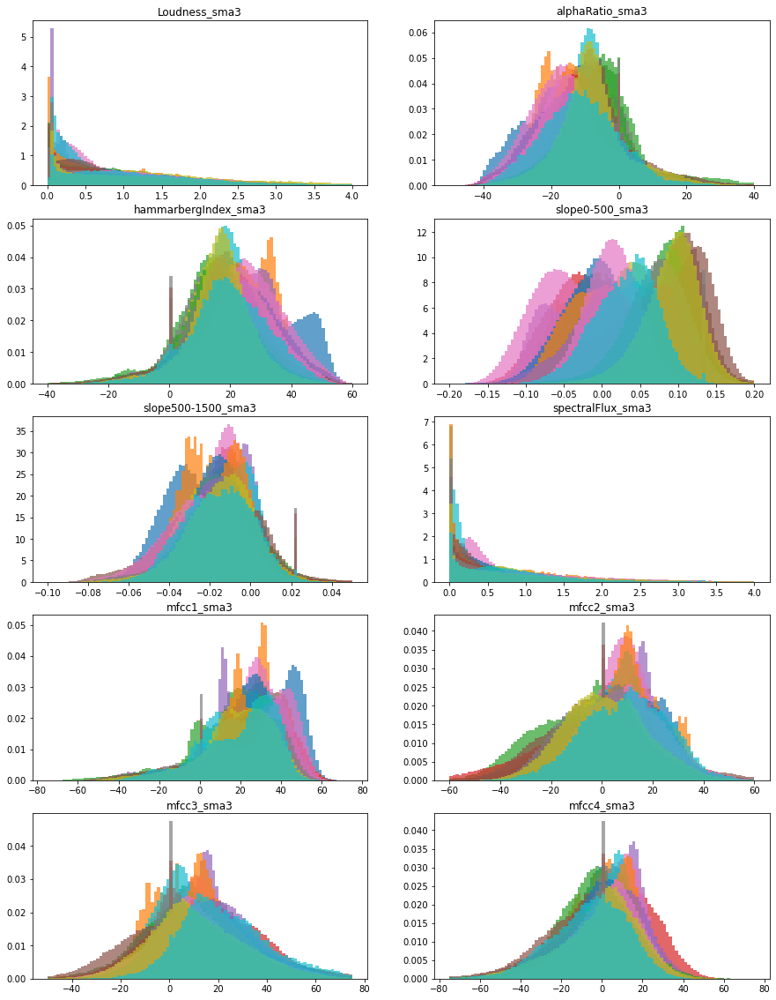

In [3]:
fig, axs = plt.subplots(5, 2, figsize=(15, 20), gridspec_kw={"wspace": 0.2, "hspace": 0.2})
for i in range(20):
    axs[0, 0].hist(lld_list[i]["Loudness_sma3"], bins=100, density=True, alpha=0.7, range=(0,4))
    axs[0, 1].hist(lld_list[i]["alphaRatio_sma3"], bins=100, density=True, alpha=0.7, range=(-50,40))
    axs[1, 0].hist(lld_list[i]["hammarbergIndex_sma3"], bins=100, density=True, alpha=0.7, range=(-40,60))
    axs[1, 1].hist(lld_list[i]["slope0-500_sma3"], bins=100, density=True, alpha=0.7, range=(-0.2,0.2))
    axs[2, 0].hist(lld_list[i]["slope500-1500_sma3"], bins=100, density=True, alpha=0.7, range=(-0.1,0.05))
    axs[2, 1].hist(lld_list[i]["spectralFlux_sma3"], bins=100, density=True, alpha=0.7, range=(0,4))
    axs[3, 0].hist(lld_list[i]["mfcc1_sma3"], bins=100, density=True, alpha=0.7, range=(-75,75))
    axs[3, 1].hist(lld_list[i]["mfcc2_sma3"], bins=100, density=True, alpha=0.7, range=(-60,60))
    axs[4, 0].hist(lld_list[i]["mfcc3_sma3"], bins=100, density=True, alpha=0.7, range=(-50,75))
    axs[4, 1].hist(lld_list[i]["mfcc4_sma3"], bins=100, density=True, alpha=0.7, range=(-75,75))
    
axs[0, 0].set_title("Loudness_sma3")
axs[0, 1].set_title("alphaRatio_sma3")
axs[1, 0].set_title("hammarbergIndex_sma3")
axs[1, 1].set_title("slope0-500_sma3")
axs[2, 0].set_title("slope500-1500_sma3")
axs[2, 1].set_title("spectralFlux_sma3")
axs[3, 0].set_title("mfcc1_sma3")
axs[3, 1].set_title("mfcc2_sma3")
axs[4, 0].set_title("mfcc3_sma3")
axs[4, 1].set_title("mfcc4_sma3")
plt.show()

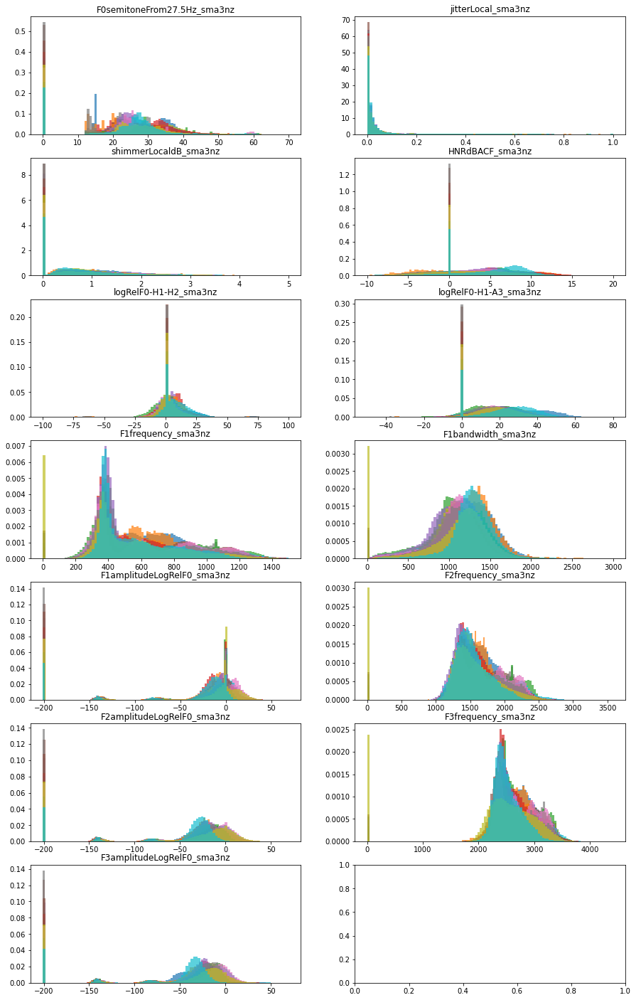

In [4]:
fig, axs = plt.subplots(7, 2, figsize=(15, 25), gridspec_kw={"wspace": 0.2, "hspace": 0.2})
for i in range(20):
    axs[0, 0].hist(lld_de_list[i]["F0semitoneFrom27.5Hz_sma3nz"], bins=100, density=True, alpha=0.7, range=(0,70))
    axs[0, 1].hist(lld_de_list[i]["jitterLocal_sma3nz"], bins=100, density=True, alpha=0.7, range=(0,1))
    axs[1, 0].hist(lld_de_list[i]["shimmerLocaldB_sma3nz"], bins=100, density=True, alpha=0.7, range=(0,5))
    axs[1, 1].hist(lld_de_list[i]["HNRdBACF_sma3nz"], bins=100, density=True, alpha=0.7, range=(-10,20))
    axs[2, 0].hist(lld_de_list[i]["logRelF0-H1-H2_sma3nz"], bins=100, density=True, alpha=0.7, range=(-100,100))
    axs[2, 1].hist(lld_de_list[i]["logRelF0-H1-A3_sma3nz"], bins=100, density=True, alpha=0.7, range=(-50,80))
    axs[3, 0].hist(lld_de_list[i]["F1frequency_sma3nz"], bins=100, density=True, alpha=0.7, range=(0,1500))
    axs[3, 1].hist(lld_de_list[i]["F1bandwidth_sma3nz"], bins=100, density=True, alpha=0.7, range=(0,3000))
    axs[4, 0].hist(lld_de_list[i]["F1amplitudeLogRelF0_sma3nz"], bins=100, density=True, alpha=0.7)
    axs[4, 1].hist(lld_de_list[i]["F2frequency_sma3nz"], bins=100, density=True, alpha=0.7)
    axs[5, 0].hist(lld_de_list[i]["F2amplitudeLogRelF0_sma3nz"], bins=100, density=True, alpha=0.7)
    axs[5, 1].hist(lld_de_list[i]["F3frequency_sma3nz"], bins=100, density=True, alpha=0.7)
    axs[6, 0].hist(lld_de_list[i]["F3amplitudeLogRelF0_sma3nz"], bins=100, density=True, alpha=0.7)
    
axs[0, 0].set_title("F0semitoneFrom27.5Hz_sma3nz")
axs[0, 1].set_title("jitterLocal_sma3nz")
axs[1, 0].set_title("shimmerLocaldB_sma3nz")
axs[1, 1].set_title("HNRdBACF_sma3nz")
axs[2, 0].set_title("logRelF0-H1-H2_sma3nz")
axs[2, 1].set_title("logRelF0-H1-A3_sma3nz")
axs[3, 0].set_title("F1frequency_sma3nz")
axs[3, 1].set_title("F1bandwidth_sma3nz")
axs[4, 0].set_title("F1amplitudeLogRelF0_sma3nz")
axs[4, 1].set_title("F2frequency_sma3nz")
axs[5, 0].set_title("F2amplitudeLogRelF0_sma3nz")
axs[5, 1].set_title("F3frequency_sma3nz")
axs[6, 0].set_title("F3amplitudeLogRelF0_sma3nz")
plt.show()

## Specific Podcast Analysis 1

Here we choose a podcast that is a mixture of audio and speech as the narrator discusses the music of Kanye West.

In [5]:
podcast = 3
lld_df = lld_list[podcast]
lld_de_df = lld_de_list[podcast]
cols_to_use = lld_de_df.columns.difference(lld_df.columns)
lld_df = pd.concat([lld_df, lld_de_df[cols_to_use]], axis=1, join='inner')
lld_df['time'] = lld_df['start'] / np.timedelta64(1, 's')
podcast_file = lld_df["file"][0]

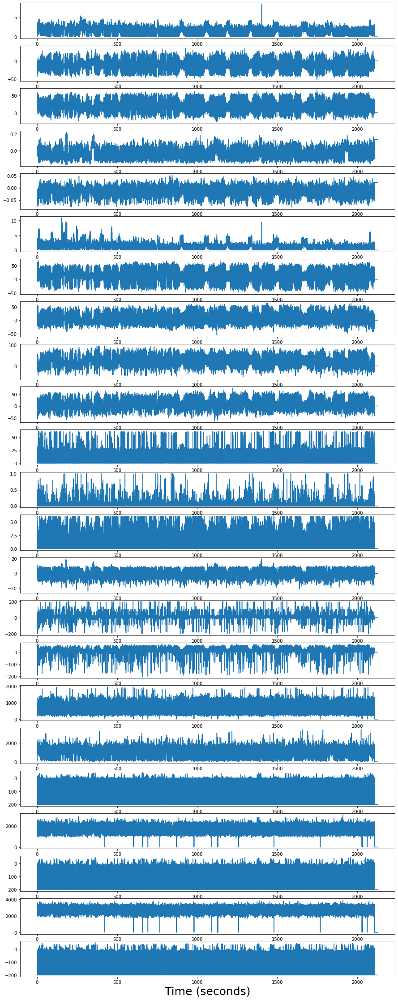

In [6]:
# You can clearly see the difference between speech and music in some of the LDD features below
features = ["Loudness_sma3", "alphaRatio_sma3", "hammarbergIndex_sma3", "slope0-500_sma3", "slope500-1500_sma3", "spectralFlux_sma3",
            "mfcc1_sma3", "mfcc2_sma3", "mfcc3_sma3", "mfcc4_sma3", "F0semitoneFrom27.5Hz_sma3nz", "jitterLocal_sma3nz", "shimmerLocaldB_sma3nz",
            "HNRdBACF_sma3nz", "logRelF0-H1-H2_sma3nz", "logRelF0-H1-A3_sma3nz", "F1frequency_sma3nz", "F1bandwidth_sma3nz",
            "F1amplitudeLogRelF0_sma3nz", "F2frequency_sma3nz", "F2amplitudeLogRelF0_sma3nz", "F3frequency_sma3nz", "F3amplitudeLogRelF0_sma3nz"]
fig, axs = plt.subplots(len(features), 1, figsize=(15, 40))
for i, feature in enumerate(features):
    axs[i].plot(lld_df["time"], lld_df[feature])
axs[len(features)-1].set_xlabel("Time (seconds)", fontsize=25)
plt.show()

Here we extract 2 second long segments starting at every 1 second boundary across the full podcast and calculate the functionals on each segment individually

In [7]:
%%time
def extract_segments(file_name, sample_rate=22050, seg_length=2, seg_overlap=1):
    y, sr = librosa.load(file_name, sr=sample_rate, duration=2000)
    segments = []
    for sample in range(0, y.shape[0], seg_overlap*sr):
        segments.append(y[sample:(sample+(seg_length*sr))])
    return segments

def extract_functionals(segments, sample_rate=22050):
    smile = opensmile.Smile(
        feature_set=opensmile.FeatureSet.eGeMAPSv01b,
        feature_level=opensmile.FeatureLevel.Functionals,
    )
    segment_dfs = [smile.process_signal(segment, sample_rate) for segment in segments]
    return pd.concat(segment_dfs, axis=0, ignore_index=True)
    
    
segments = extract_segments(podcast_file)
funcs = extract_functionals(segments)
standardised_input = StandardScaler().fit_transform(funcs)

CPU times: user 5min 14s, sys: 2.05 s, total: 5min 16s
Wall time: 5min 30s


In [8]:
# We then can run PCA and t-SNE on the output functionals to see if the podcast naturally clusters
components = 2

# Conduct Principal Component Analysis (PCA)
pca = PCA(n_components=components)
pca_result = pca.fit_transform(standardised_input)
pca_result = np.split(pca_result, components, axis=1)
for component in range(components):
    funcs["pca" + str(component)] = pca_result[component]

# Conduct t-Distributed Stochastic Neighbor Embedding (t-SNE)
tsne = TSNE(n_components=components, perplexity=30.0, early_exaggeration=12.0, learning_rate=200.0)
tsne_result = tsne.fit_transform(standardised_input)
tsne_result = np.split(tsne_result, components, axis=1)
for component in range(components):
    funcs["tsne" + str(component)] = tsne_result[component]

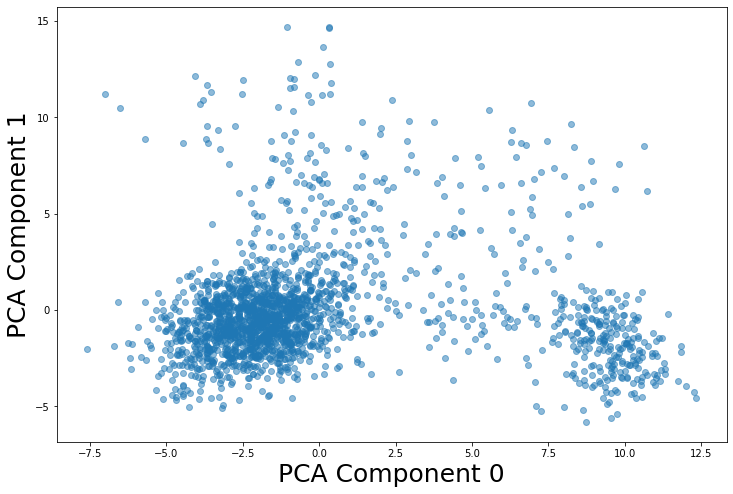

In [9]:
# You can clearly see two clusters form between speech and music
fig, axs = plt.subplots(1, 1, figsize=(12, 8))
axs.margins(0.05) # Optional, just adds 5% padding to the autoscaling
axs.plot(funcs.pca0, funcs.pca1, marker='.', linestyle='', ms=12, alpha=0.5, color="tab:blue")
axs.set_xlabel('PCA Component 0', fontsize=25)
axs.set_ylabel('PCA Component 1', fontsize=25)
plt.show()

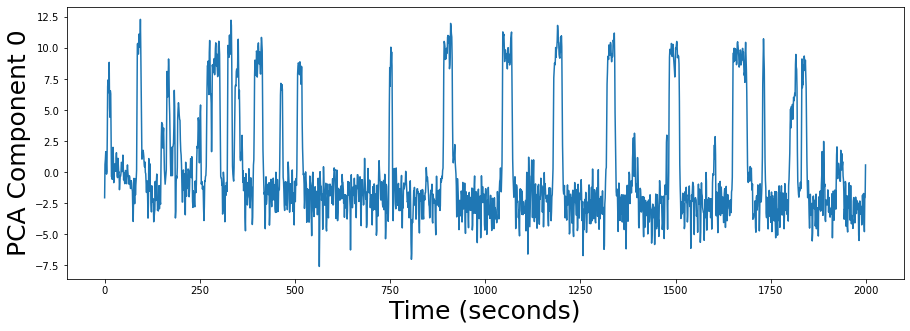

In [10]:
# When the first PCA component is plotted with time it clearly seperates the speech and music sections of the podcast
fig, axs = plt.subplots(figsize=(15, 5))
axs.plot(funcs["pca0"])
axs.set_xlabel("Time (seconds)", fontsize=25)
axs.set_ylabel("PCA Component 0", fontsize=25)
plt.show()

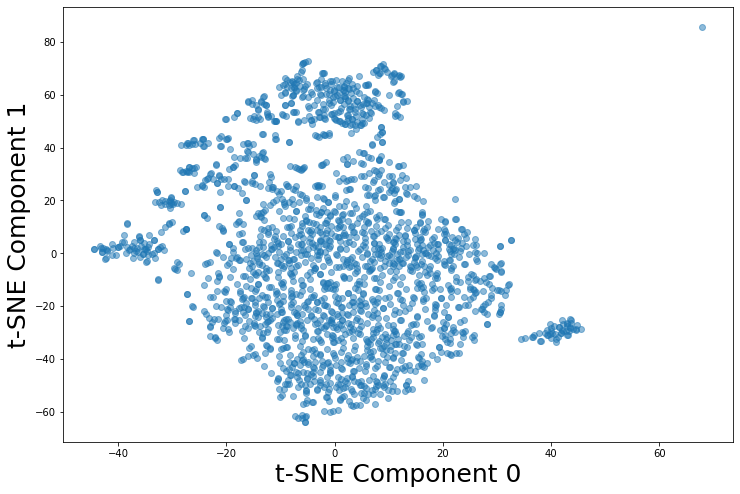

In [11]:
# t-SNE doesn't seem to be as clear, but may be clustering more fine grained groupings
fig, axs = plt.subplots(1, 1, figsize=(12, 8))
axs.margins(0.05) # Optional, just adds 5% padding to the autoscaling
axs.plot(funcs.tsne0, funcs.tsne1, marker='.', linestyle='', ms=12, alpha=0.5, color="tab:blue")
axs.set_xlabel('t-SNE Component 0', fontsize=25)
axs.set_ylabel('t-SNE Component 1', fontsize=25)
plt.show()

In [12]:
# Let's zoom in on the 80 seconds long section between 840 and 920 seconds
y, sr = librosa.load(podcast_file, offset=840, duration=80)
lld_df_zoom = lld_df[84000:92000]
IPython.display.Audio(data=y, rate=sr)

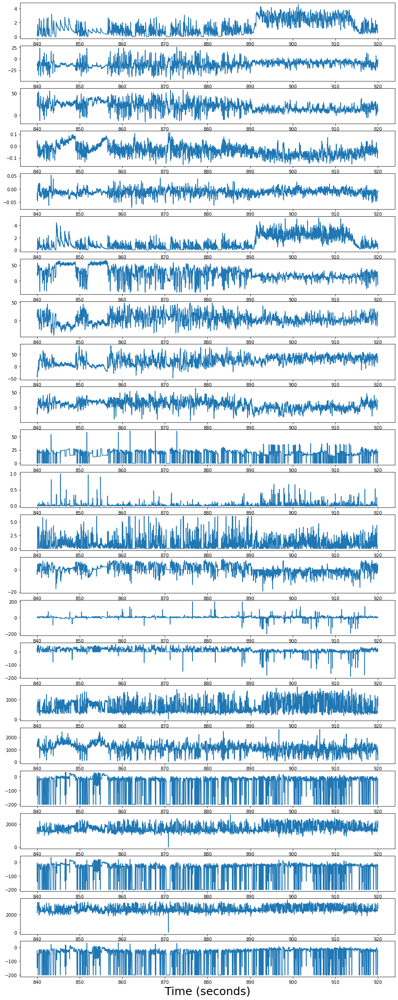

In [13]:
# Again you can clearly see the seperationg between speech and music, even the individual chords can be seen towards the start
fig, axs = plt.subplots(len(features), 1, figsize=(15, 40))
for i, feature in enumerate(features):
    axs[i].plot(lld_df_zoom["time"], lld_df_zoom[feature])
axs[len(features)-1].set_xlabel("Time (seconds)", fontsize=25)
plt.show()

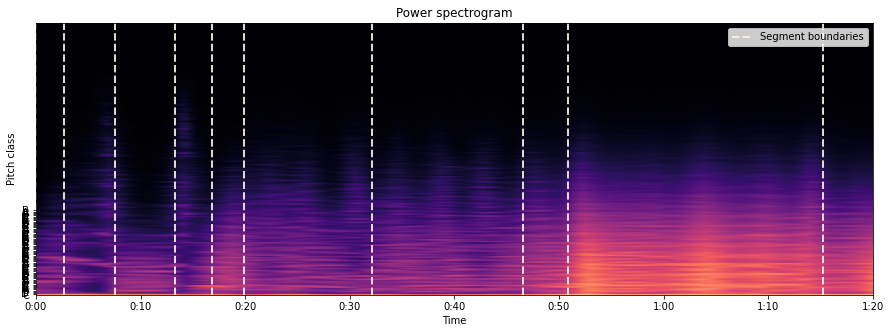

In [14]:
# On a slightly seperate note, librosa contains a segmentation method, which we use here on the tempogram of the above podcast section
chroma = librosa.feature.tempogram(y=y, sr=sr)
bounds = librosa.segment.agglomerative(chroma, 10)
bound_times = librosa.frames_to_time(bounds, sr=sr)
fig, ax = plt.subplots(figsize=(15, 5))
librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', ax=ax)
ax.vlines(bound_times, 0, chroma.shape[0], color='linen', linestyle='--',
          linewidth=2, alpha=0.9, label='Segment boundaries')
ax.legend()
ax.set(title='Power spectrogram')
plt.show()

## Specific Podcast Analysis 2

Here we choose a podcast that is mainly two people talking about baseball

In [15]:
podcast = 4
lld_df = lld_list[podcast]
lld_de_df = lld_de_list[podcast]
cols_to_use = lld_de_df.columns.difference(lld_df.columns)
lld_df = pd.concat([lld_df, lld_de_df[cols_to_use]], axis=1, join='inner')
lld_df['time'] = lld_df['start'] / np.timedelta64(1, 's')
podcast_file = lld_df["file"][0]

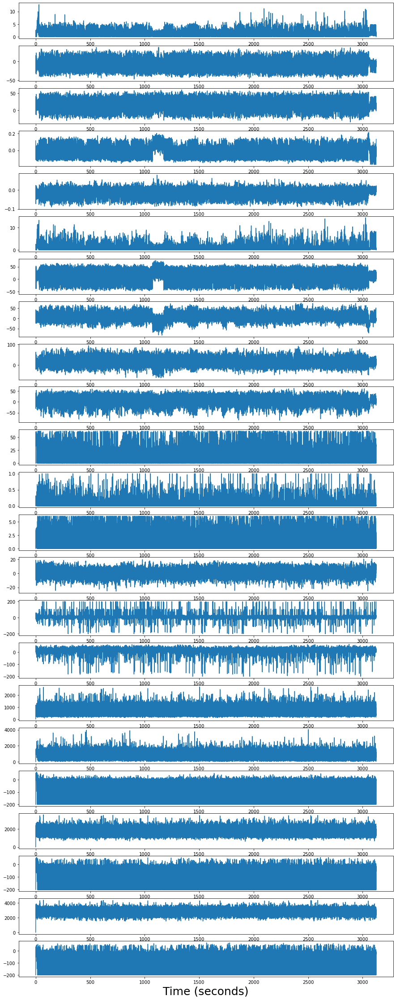

In [16]:
# You can clearly see the difference between speech and music in some of the LDD features below
features = ["Loudness_sma3", "alphaRatio_sma3", "hammarbergIndex_sma3", "slope0-500_sma3", "slope500-1500_sma3", "spectralFlux_sma3",
            "mfcc1_sma3", "mfcc2_sma3", "mfcc3_sma3", "mfcc4_sma3", "F0semitoneFrom27.5Hz_sma3nz", "jitterLocal_sma3nz", "shimmerLocaldB_sma3nz",
            "HNRdBACF_sma3nz", "logRelF0-H1-H2_sma3nz", "logRelF0-H1-A3_sma3nz", "F1frequency_sma3nz", "F1bandwidth_sma3nz",
            "F1amplitudeLogRelF0_sma3nz", "F2frequency_sma3nz", "F2amplitudeLogRelF0_sma3nz", "F3frequency_sma3nz", "F3amplitudeLogRelF0_sma3nz"]
fig, axs = plt.subplots(len(features), 1, figsize=(15, 40))
for i, feature in enumerate(features):
    axs[i].plot(lld_df["time"], lld_df[feature])
axs[len(features)-1].set_xlabel("Time (seconds)", fontsize=25)
plt.show()

In [17]:
segments = extract_segments(podcast_file)
funcs = extract_functionals(segments)
standardised_input = StandardScaler().fit_transform(funcs)

In [18]:
# We then can run PCA and t-SNE on the output functionals to see if the podcast naturally clusters
components = 2

# Conduct Principal Component Analysis (PCA)
pca = PCA(n_components=components)
pca_result = pca.fit_transform(standardised_input)
pca_result = np.split(pca_result, components, axis=1)
for component in range(components):
    funcs["pca" + str(component)] = pca_result[component]

# Conduct t-Distributed Stochastic Neighbor Embedding (t-SNE)
tsne = TSNE(n_components=components, perplexity=30.0, early_exaggeration=12.0, learning_rate=200.0)
tsne_result = tsne.fit_transform(standardised_input)
tsne_result = np.split(tsne_result, components, axis=1)
for component in range(components):
    funcs["tsne" + str(component)] = tsne_result[component]

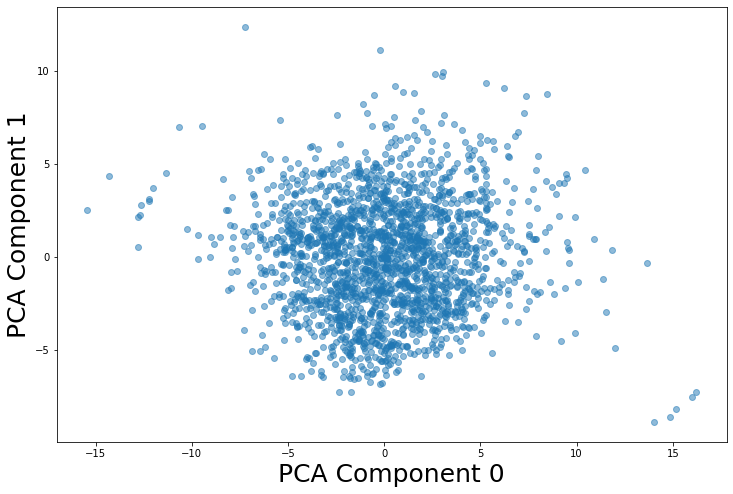

In [19]:
# Here we see no obvious clustering with PCA
fig, axs = plt.subplots(1, 1, figsize=(12, 8))
axs.margins(0.05) # Optional, just adds 5% padding to the autoscaling
axs.plot(funcs.pca0, funcs.pca1, marker='.', linestyle='', ms=12, alpha=0.5, color="tab:blue")
axs.set_xlabel('PCA Component 0', fontsize=25)
axs.set_ylabel('PCA Component 1', fontsize=25)
plt.show()

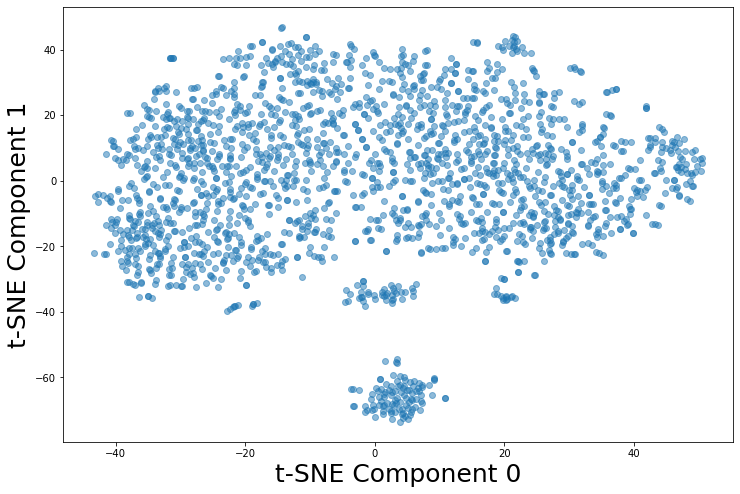

In [20]:
# t-SNE does seem to atleast seperate two clusters
fig, axs = plt.subplots(1, 1, figsize=(12, 8))
axs.margins(0.05) # Optional, just adds 5% padding to the autoscaling
axs.plot(funcs.tsne0, funcs.tsne1, marker='.', linestyle='', ms=12, alpha=0.5, color="tab:blue")
axs.set_xlabel('t-SNE Component 0', fontsize=25)
axs.set_ylabel('t-SNE Component 1', fontsize=25)
plt.show()

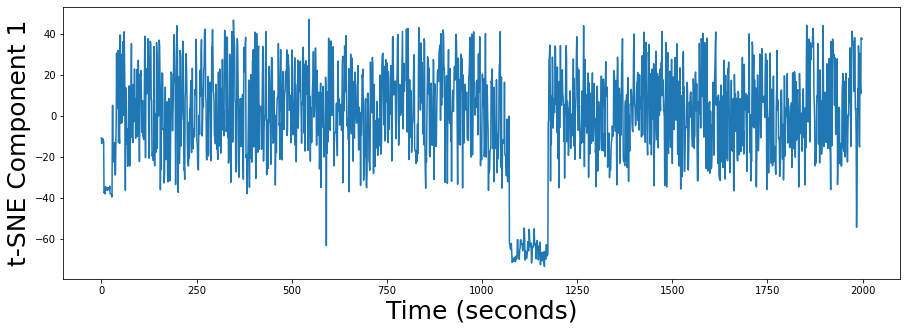

In [23]:
# This seems to be related to a voicemail (with a much worse microphone) that is played between ~1050-1200 seconds
fig, axs = plt.subplots(figsize=(15, 5))
axs.plot(funcs["tsne1"])
axs.set_xlabel("Time (seconds)", fontsize=25)
axs.set_ylabel("t-SNE Component 1", fontsize=25)
plt.show()

In [22]:
# You can listen to this snippet here
y, sr = librosa.load(podcast_file, offset=1050, duration=100)
IPython.display.Audio(data=y, rate=sr)